## 06. cgan for dataimpurity.csv with updated discriminator and generator

need to address BCELoss issue in training loop and max pooling + flattening 

In [247]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from sklearn.preprocessing import MinMaxScaler
from tqdm.auto import tqdm

import os

### Importing data/basic viz

In [138]:
# DATA_FOLDER = "AirQualityUCI"
# DATA_FILE = "AirQualityUCI.csv"
#path = os.path.join('',DATA_FOLDER, DATA_FILE)
# load csv into df
df = pd.read_csv(r'/Users/emilymiura/dowgan-ems/notebooks/ems-experiments/dataimpurity.csv', 
                 delimiter='\t')
#                 parse_dates=[['Date', 'Time']],
#                 decimal=',')



In [139]:
#Shape of data
print(f'shape of data: {df.shape}')

#Dropping date column and putting column names in a list bc they are so long
data = df.drop(df.columns[0],axis=1)
time = np.arange(0,len(data))
data.insert(0,'Time',time)

#List of all the column names
list_colnames=list(data)
print(f"shape of data after removing date column and adding time: {data.shape}")
print(f"number of columns: {len(data.columns)}")

shape of data: (10177, 47)
shape of data after removing date column and adding time: (10177, 47)
number of columns: 47


In [140]:
#Counting the number of null values in each column
na_vals = []
for x in np.arange(0,len(list_colnames)):
    na_vals.append(data[list_colnames[x]].isnull().sum())

na_vals_dict = dict(zip(np.arange(0,len(list_colnames)),na_vals))
print(na_vals_dict)

{0: 0, 1: 1, 2: 2, 3: 1, 4: 1, 5: 1, 6: 1, 7: 1, 8: 1, 9: 0, 10: 0, 11: 0, 12: 0, 13: 1, 14: 0, 15: 2, 16: 0, 17: 0, 18: 0, 19: 0, 20: 0, 21: 0, 22: 0, 23: 1, 24: 1, 25: 0, 26: 0, 27: 1, 28: 0, 29: 1, 30: 0, 31: 0, 32: 0, 33: 0, 34: 1, 35: 0, 36: 0, 37: 0, 38: 1, 39: 0, 40: 1, 41: 94, 42: 287, 43: 0, 44: 1, 45: 1, 46: 0}


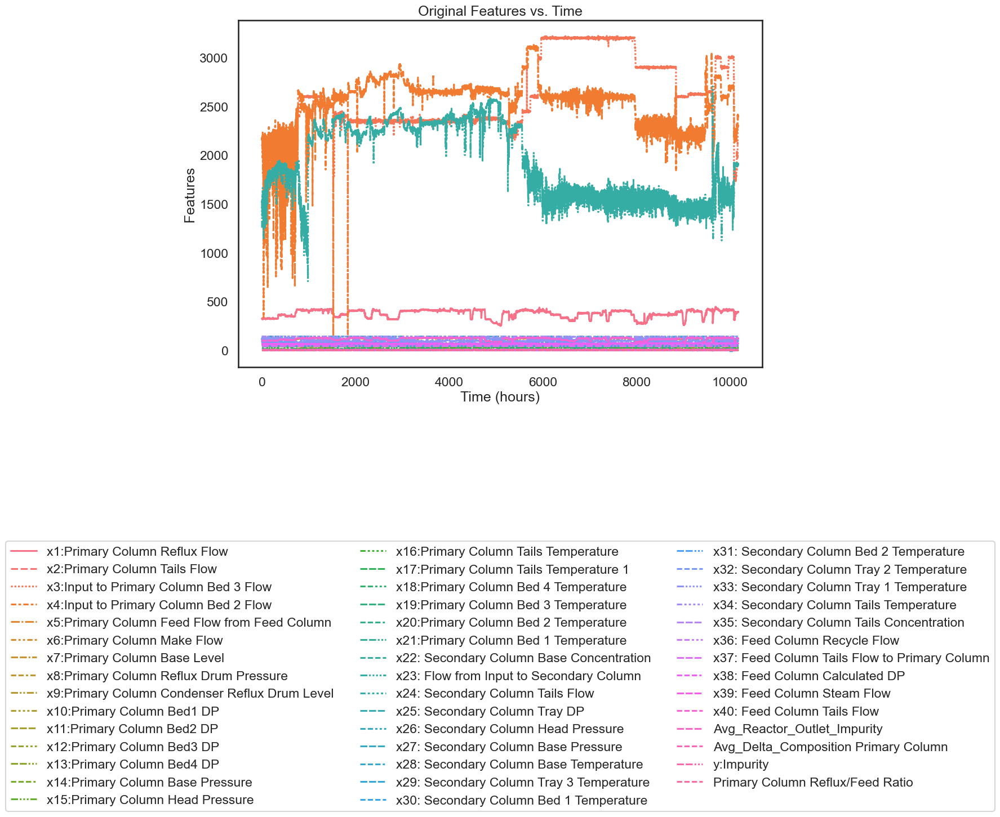

In [284]:
# plotting original data vs time for first 500 points
sns.lineplot(data=data.iloc[0:,1:45])
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -1.30), ncols=3)
plt.title('Original Features vs. Time')
plt.xlabel('Time (hours)')
plt.ylabel('Features');

### Splitting data into target and conditions and performing MinMax scaling on target data

In [250]:
# splitting data into target and conditions data
target_data = data.iloc[:,1:46]
print(f"shape of target_tensor (all features): {target_data.shape}")

conditions_data = data['Class'].values.reshape(-1,1)
print(f"shape of conditions_tensor (operating conditions): {conditions_data.shape}")

shape of target_tensor (all features): (10177, 45)
shape of conditions_tensor (operating conditions): (10177, 1)


In [251]:
# performing MinMax scaling
scaler = MinMaxScaler(feature_range=(0,1))

# fit & transform scaler data
targets = scaler.fit_transform(target_data)

column_names = list(data.columns.values[1:46])
target_data_scaled = pd.DataFrame(targets, columns=column_names)

In [252]:
target_data_scaled.head()

,x1:Primary Column Reflux Flow,x2:Primary Column Tails Flow,x3:Input to Primary Column Bed 3 Flow,x4:Input to Primary Column Bed 2 Flow,x5:Primary Column Feed Flow from Feed Column,x6:Primary Column Make Flow,x7:Primary Column Base Level,x8:Primary Column Reflux Drum Pressure,x9:Primary Column Condenser Reflux Drum Level,x10:Primary Column Bed1 DP,...,x36: Feed Column Recycle Flow,x37: Feed Column Tails Flow to Primary Column,x38: Feed Column Calculated DP,x39: Feed Column Steam Flow,x40: Feed Column Tails Flow,Avg_Reactor_Outlet_Impurity,Avg_Delta_Composition Primary Column,y:Impurity,Primary Column Reflux/Feed Ratio,Primary Column Make/Reflux Ratio
0,0.391600,0.030180,0.650096,0.688736,0.386265,0.740026,0.636397,0.722679,0.671141,0.171573,...,0.182387,0.666418,0.133559,0.353899,0.376661,0.425389,0.558895,0.202096,0.286604,0.897926
1,0.366929,0.090427,0.651939,0.697323,0.378657,0.736146,0.632347,0.722179,0.674938,0.160718,...,0.170385,0.666418,0.130526,0.389975,0.375123,0.421690,0.564976,0.201109,0.271304,0.906620
2,0.350138,0.062658,0.652548,0.687260,0.391179,0.744767,0.645143,0.726348,0.668387,0.163780,...,0.171456,0.666418,0.117122,0.362696,0.381188,0.425115,0.562237,0.200121,0.242679,0.926699
3,0.388595,0.079374,0.652054,0.693887,0.390423,0.745106,0.655105,0.725837,0.680083,0.176442,...,0.174244,0.666418,0.169395,0.386097,0.382305,0.420876,0.552486,0.199134,0.279460,0.905719
4,0.408738,0.039453,0.655992,0.689298,0.398804,0.734477,0.627991,0.720600,0.681376,0.172465,...,0.175094,0.666418,0.160519,0.378285,0.387641,0.417643,0.540036,0.198146,0.289581,0.882133


### Putting data into tensors 

In [253]:
# converting target and conditions into tensors
target_tensor = torch.tensor(target_data_scaled.values, dtype=torch.float32)
print(f"shape of target_tensor (all features): {target_tensor.shape}")

conditions_tensor = torch.tensor(conditions_data, dtype=torch.float32)
print(f"shape of conditions_tensor (operating conditions): {conditions_tensor.shape}")

# print(f'first timepoint (row): {target_tensor[0]}')
# print(f'first feature (col): {target_tensor[:,0]}')

shape of target_tensor (all features): torch.Size([10177, 45])
shape of conditions_tensor (operating conditions): torch.Size([10177, 1])


### Batching data

We are aiming for a list of tensors (target_tensor_list and condition_tensor_list) that have shapes:
* `target_tensor_list = [368, 24, 45]`
* `conditions_tensor_list = [368, 24, 1]`
* where the shape is [`N_SAMPLES`, `N_DATAPOINTS`, `N_FEATURES`]

we are also REMOVING any days with NaN values present

In [254]:
# Included step where is there is a nan value to not include it in the final tensor list
# Not sure if this is how we want to do this rn but an idea.

# Data is taken per hour - splitting up batches into "days" of data
# N_SAMPLES = 10177 // 24 = 424 DAYS of data where each CHUNK (i.e. 24 datapoints) is 1 DAY

N_SAMPLES = 424
N_DATAPOINTS = data.shape[0]//N_SAMPLES

target_tensor_list = []
conditions_tensor_list = []
invalid_batch_indexes = []

#Iterating through all of the data and dividing it up
for i in np.arange(0, N_SAMPLES, 1):
    
    #Taking a batch of the target data
    a = torch.split(target_tensor, N_DATAPOINTS, dim=0)[i]
    #Checking for any NaNs in that tensor
    # if its true, not saving it and the condition tensor to the list
    if torch.isnan(a).any() == True:
        invalid_batch_indexes.append(i)
        continue
    else:
        target_tensor_list.append(a)

    #Taking the corresponding batch of conditions
    b = torch.split(conditions_tensor, N_DATAPOINTS, dim=0)[i]
    conditions_tensor_list.append(b)

print(f'length of data: {data.shape[0]}')
print(f'We have {len(target_tensor_list)} samples with {N_DATAPOINTS} datapoints in each.')
print(f'There are {len(invalid_batch_indexes)} invalid batches.')

length of data: 10177
We have 368 samples with 24 datapoints in each.
There are 56 invalid batches.


In [255]:
#Confirming # of tensors and condition lists
#Confirming that the last batch has 101 points (not truncating)
print(f'length of target: {len(target_tensor_list)}')
print(f'length of conditions: {len(conditions_tensor_list)}')
print(f'shape of last target tensor: {target_tensor_list[len(target_tensor_list)-1].shape}')
print(f'shape of last condition tensor: {conditions_tensor_list[len(target_tensor_list)-1].shape}')


length of target: 368
length of conditions: 368
shape of last target tensor: torch.Size([24, 45])
shape of last condition tensor: torch.Size([24, 1])


In [256]:
# making a custom dataset class
class ImpuritiesDataset(Dataset):
    def __init__(self, target, conditions):
        self.target = target
        self.conditions = conditions
    def __len__(self):
        return len(self.conditions)
    def __getitem__(self, idx):
        condition = self.conditions[idx]
        target = self.target[idx]
        return target, condition

In [257]:
#Inputting data into AirQualityDataset class
train_data = ImpuritiesDataset(target=target_tensor_list,
                               conditions=conditions_tensor_list)
target, condition = next(iter(train_data))[0], next(iter(train_data))[1]
print(target.shape)
print(condition.shape)

torch.Size([24, 45])
torch.Size([24, 1])


### Inputting Data into dataloader

In [258]:
from torch.utils.data import DataLoader

BATCH_SIZE = 20

train_dataloader = DataLoader(
    dataset=train_data,
    batch_size=BATCH_SIZE,
    shuffle=False,
)

print(f"dataloader: {train_dataloader}")
print(f"length of train_dataloader: {len(train_dataloader)} batches of {BATCH_SIZE} (batch_size) examples")
print(f"number of total examples: {len(train_data)} \neach example containing... \nTARGET shape (number of timepoints): {train_data[0][0].shape} \nCONDITION shape (class 1 or 2): {train_data[0][1].shape}")

dataloader: <torch.utils.data.dataloader.DataLoader object at 0x7f77ebb83fd0>
length of train_dataloader: 19 batches of 20 (batch_size) examples
number of total examples: 368 
each example containing... 
TARGET shape (number of timepoints): torch.Size([24, 45]) 
CONDITION shape (class 1 or 2): torch.Size([24, 1])


In [259]:
# # for loop to check the size of batch in the dataloader
# # BATCH NUMBER 18 is SMALLER -> it is left out of the training loop
# for i, (target, condition) in enumerate(train_dataloader):
#     print(i, len(condition))

### Running 1 batch of targets and conditions through test layers

In [260]:
train_target_batch, train_condition_batch = next(iter(train_dataloader))
print(f"training target batch size: {train_target_batch.shape}")
print(f"training condition batch: {train_condition_batch.shape}")

training target batch size: torch.Size([20, 24, 45])
training condition batch: torch.Size([20, 24, 1])


In [261]:
# concatening batched data together for forward pass
train_input_batch = torch.cat([train_target_batch, train_condition_batch], axis=2)
print(train_input_batch.shape)

# transposing concatenated data for input into conv1d layer [batchsize, columns, datapoints]
train_input_batch_transposed = torch.transpose(train_input_batch, 1, 2)
print(train_input_batch_transposed.shape)

torch.Size([20, 24, 46])
torch.Size([20, 46, 24])


In [262]:
# trying out Conv1d + LeakyReLU + Max Pooling + Flatten - for discriminator
# based on this cgan structure:
# https://towardsdatascience.com/cgan-conditional-generative-adversarial-network-how-to-gain-control-over-gan-outputs-b30620bd0cc8

conv1d_0 = nn.Conv1d(in_channels=46,
                        out_channels=8,
                        kernel_size=3,
                        stride=2,
                        padding=1)
conv1d_out = conv1d_0(train_input_batch_transposed)
print("conv1d_out (0): ", conv1d_out.shape)

leaky_relu_0 = nn.LeakyReLU(negative_slope=0.2)
leaky_relu_out = leaky_relu_0(conv1d_out)
print("leaky_relu_out (0): ", leaky_relu_out.shape)

conv1d_1 = nn.Conv1d(in_channels=8,
                        out_channels=8,
                        kernel_size=3,
                        stride=2,
                        padding=1)
conv1d_1_out = conv1d_1(leaky_relu_out)
print("conv1d_out (1): ", conv1d_out.shape)

leaky_relu_1 = nn.LeakyReLU(negative_slope=0.2)
leaky_relu_1_out = leaky_relu_1(conv1d_1_out)
print("leaky_relu_out (1): ", leaky_relu_1_out.shape)

maxpool = nn.MaxPool1d(kernel_size=3, 
                            stride=2, 
                            padding=1)

maxpool_out = maxpool(leaky_relu_1_out)
print("maxpool_out: ", maxpool_out.shape)

# passing through flatten layer
flatten = nn.Flatten()
flatten_out = flatten(maxpool_out)
print("flatten_out: ", flatten_out.shape)

# dropout layer
dropout = nn.Dropout(p=0.2)
dropout_out = dropout(flatten_out)
print("dropout_out: ", dropout_out.shape)

# transposed_0 = torch.transpose(dropout_out, 1, 2)
# print("transposed: ", transposed_0.shape)

# adding linear layer to get size to 1
linear = nn.Linear(in_features=8*3,
                   out_features=1)
linear_out = linear(dropout_out)
print("linear_out: ", linear_out.shape)

# finally activation function sigmoid
sigmoid = nn.Sigmoid()
sigmoid_out = sigmoid(linear_out)
print("sigmoid_out: ", sigmoid_out.shape)

conv1d_out (0):  torch.Size([20, 8, 12])
leaky_relu_out (0):  torch.Size([20, 8, 12])
conv1d_out (1):  torch.Size([20, 8, 12])
leaky_relu_out (1):  torch.Size([20, 8, 6])
maxpool_out:  torch.Size([20, 8, 3])
flatten_out:  torch.Size([20, 24])
dropout_out:  torch.Size([20, 24])
linear_out:  torch.Size([20, 1])
sigmoid_out:  torch.Size([20, 1])


In [263]:
# trying out convtranspose1d + relu + tanh activation - for generator
# based on this cgan structure:
# https://towardsdatascience.com/cgan-conditional-generative-adversarial-network-how-to-gain-control-over-gan-outputs-b30620bd0cc8

conv1d_transpose_0 = nn.ConvTranspose1d(in_channels=46,
                        out_channels=8,
                        kernel_size=3,
                        stride=1,
                        padding=1)
conv1d_transpose_out_0 = conv1d_transpose_0(train_input_batch_transposed)
print("conv1d_transpose_out (0): ", conv1d_transpose_out_0.shape)

relu_0 = nn.ReLU()
relu_out_0 = relu_0(conv1d_transpose_out_0)
print("relu_out (0): ", relu_out_0.shape)

conv1d_transpose_1 = nn.ConvTranspose1d(in_channels=8,
                        out_channels=8,
                        kernel_size=3,
                        stride=1,
                        padding=1)
conv1d_transpose_out_1 = conv1d_transpose_1(relu_out_0)
print("conv1d_transpose_out (1): ", conv1d_transpose_out_1.shape)

relu_1 = nn.ReLU()
relu_out_1 = relu_1(conv1d_transpose_out_1)
print("relu_out (1): ", relu_out_1.shape)

#batch norm output
batchnorm = nn.BatchNorm1d(num_features=8)
batchnorm_out = batchnorm(relu_out_1)
print("batchnorm_out: ", batchnorm_out.shape)

# conv1d output layer
conv1d_2 = nn.Conv1d(in_channels=8,
                     out_channels=45,
                     kernel_size=3,
                     stride=1,
                     padding=1)
conv1d_out_2 = conv1d_2(batchnorm_out)
print("conv1d_out_2: ", conv1d_out_2.shape)

# activation function tanh?
transposed = torch.transpose(conv1d_out_2, 1, 2)
print("transposed: ", transposed.shape)
tanh = nn.Tanh()
tanh_out = tanh(transposed)
print("tanh_out: ", tanh_out.shape)

# linear_1 = nn.Linear(in_features=8,
#                      out_features=45)
# linear_out_1 = linear_1(transposed)
# print("linear_out_1: ", linear_out_1.shape)

conv1d_transpose_out (0):  torch.Size([20, 8, 24])
relu_out (0):  torch.Size([20, 8, 24])
conv1d_transpose_out (1):  torch.Size([20, 8, 24])
relu_out (1):  torch.Size([20, 8, 24])
batchnorm_out:  torch.Size([20, 8, 24])
conv1d_out_2:  torch.Size([20, 45, 24])
transposed:  torch.Size([20, 24, 45])
tanh_out:  torch.Size([20, 24, 45])


### coding discriminator and generator

In [264]:
# defining a disciminator model

from torch import nn

class Discriminator(nn.Module):
    def __init__(self, input_shape: int, hidden_units: int, output_shape: int):
        super().__init__()
        # input shape is number of columns
        # output shape is 2 (for probability of 0 or 1)

        # pass concatenated target+conditions through nn.Sequential
        self.main = nn.Sequential(
            # input is INPUT SHAPE // number of columns/channels
            nn.Conv1d(in_channels=input_shape,
                      out_channels=hidden_units,
                      kernel_size=3,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.LeakyReLU(negative_slope=0.2),
            nn.Conv1d(in_channels=hidden_units,
                      out_channels=hidden_units,
                      kernel_size=3,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.LeakyReLU(negative_slope=0.2),
            nn.MaxPool1d(kernel_size=3,
                         stride=2,
                         padding=1),
            nn.Flatten(),
            nn.Dropout(p=0.2),
        )

        self.linearize = nn.Sequential(
            nn.Linear(in_features=hidden_units*3,
                      out_features=output_shape),
            nn.Sigmoid() # output of probability
        )

    def forward(self, target, conditions):
        """takes target and conditions as batches"""
        # concatenating and transposing
        data = torch.cat([target, conditions], axis=2)
        data_in = torch.transpose(data, 1, 2)

        # forward pass through nn.Main
        out = self.main(data_in)
        # forward pass through nn.linear + nn.sigmoid
        out = self.linearize(out)
    
        return out

In [265]:
# defining a generator model

from torch import nn

class Generator(nn.Module):
    def __init__(self, input_shape: int, hidden_units: int, output_shape: int):
        super().__init__()
        # input shape is number of columns
        # output shape is 2 (for probability of 0 or 1)

        # pass concatenated target+conditions through nn.Sequential
        self.main = nn.Sequential(
            # input is INPUT SHAPE // number of columns/channels
            nn.ConvTranspose1d(in_channels=input_shape,
                               out_channels=hidden_units,
                               kernel_size=3,
                               stride=1,
                               padding=1),
            nn.ReLU(),
            nn.ConvTranspose1d(in_channels=hidden_units,
                               out_channels=hidden_units,
                               kernel_size=3,
                               stride=1,
                               padding=1),
            nn.ReLU(),
            nn.BatchNorm1d(num_features=hidden_units),
            nn.Conv1d(in_channels=hidden_units,
                      out_channels=45,
                      kernel_size=3,
                      stride=1,
                      padding=1)
    	)

        self.sigmoid = nn.Sigmoid()

    def forward(self, noise, conditions):
        """takes target and conditions as batches"""
        # concatenating and transposing
        data = torch.cat([noise, conditions], axis=2)
        data_in = torch.transpose(data, 1, 2)

        # forward pass through nn.Main
        out = self.main(data_in)

        # tranposing the data for activation function
        data_in = torch.transpose(out, 1, 2)

        # forward pass through nn.Activation
        out = self.sigmoid(data_in)
    
        return out

In [266]:
# input shape is number of channels (X features), target+conditions columns
# output shape is number of probabilities (0, 1 for true or false)
netD = Discriminator(input_shape=46, hidden_units=8, output_shape=1)
netD

Discriminator(
  (main): Sequential(
    (0): Conv1d(46, 8, kernel_size=(3,), stride=(2,), padding=(1,), bias=False)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Conv1d(8, 8, kernel_size=(3,), stride=(2,), padding=(1,), bias=False)
    (3): LeakyReLU(negative_slope=0.2)
    (4): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (5): Flatten(start_dim=1, end_dim=-1)
    (6): Dropout(p=0.2, inplace=False)
  )
  (linearize): Sequential(
    (0): Linear(in_features=24, out_features=1, bias=True)
    (1): Sigmoid()
  )
)

In [267]:
netG = Generator(input_shape=46, hidden_units=8, output_shape=45)
netG

Generator(
  (main): Sequential(
    (0): ConvTranspose1d(46, 8, kernel_size=(3,), stride=(1,), padding=(1,))
    (1): ReLU()
    (2): ConvTranspose1d(8, 8, kernel_size=(3,), stride=(1,), padding=(1,))
    (3): ReLU()
    (4): BatchNorm1d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Conv1d(8, 45, kernel_size=(3,), stride=(1,), padding=(1,))
  )
  (sigmoid): Sigmoid()
)

In [268]:
noise = torch.randn((BATCH_SIZE, 24, 45))
noise.shape # inputting random data same shape as original targets

torch.Size([20, 24, 45])

In [269]:
loss_D_list = []
loss_G_list = []

epochs = 200

netD.train()
netG.train()

# optimizer for discriminator and generator
optimizerD = torch.optim.Adam(netD.parameters(),lr=0.0005,betas=(0.5, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(),lr=0.0005,betas=(0.5, 0.999))


real_condition = torch.ones([BATCH_SIZE, 1], dtype=torch.float)
fake_condition = torch.zeros([BATCH_SIZE, 1], dtype=torch.float)

G_loss_fn = nn.MSELoss()
D_loss_fn = nn.BCELoss()

# Iterating through epochs
for epoch in tqdm(range(epochs)):

	# Iterating through batches (i: iterable int, target: target, condition: condition)
    for i, (target, condition) in enumerate(train_dataloader):

        # for iterating through only FULL BATCHES
        if len(condition) == BATCH_SIZE:

            # initializng fixed noise to generator
            fixed_noise = torch.randn((BATCH_SIZE, 24, 45))

            '''
                Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            '''
            # Generating data and feeding it to the discriminator
            G_result = netG(fixed_noise,condition)
            D_fake_result = netD(G_result,condition)

            # Inputting real results into discriminator
            D_real_result = netD(target, condition)

            # Calculating the loss for the real and the generated data
            D_real_loss = D_loss_fn(D_real_result, real_condition)
            D_fake_loss = D_loss_fn(D_fake_result, fake_condition)

            # Back propagation
            D_train_loss = (D_real_loss + D_fake_loss) / 2
            netD.zero_grad()
            D_train_loss.backward()
            optimizerD.step()
            '''
                Update G network: maximize log(D(G(z)))
            '''
            new_condition = torch.LongTensor(BATCH_SIZE, 24, 1).random_(1, 2)
            G_result = netG(fixed_noise, new_condition)
            D_fake_result = netD(G_result, new_condition)
            G_train_loss = G_loss_fn(D_fake_result, real_condition)
            

            # Back propagation
            netD.zero_grad()
            netG.zero_grad()
            G_train_loss.backward()
            optimizerG.step()
        else:
            pass

    # per epoch, append loss info:
    loss_G_list.append(G_train_loss)
    loss_D_list.append(D_train_loss)

    # print progress per 10 epochs
    if (epoch+1) % 10 == 0:
                print(f"Epoch: {epoch+1}/{epochs} | D_loss: {D_train_loss:.4f} | G_loss: {G_train_loss:.4f}")
    else:
          pass

  5%|▌         | 10/200 [00:03<01:10,  2.70it/s]

Epoch: 10/200 | D_loss: 0.5547 | G_loss: 0.6093


 10%|█         | 20/200 [00:07<01:08,  2.63it/s]

Epoch: 20/200 | D_loss: 0.8724 | G_loss: 0.1839


 15%|█▌        | 30/200 [00:11<01:04,  2.63it/s]

Epoch: 30/200 | D_loss: 0.6573 | G_loss: 0.2672


 20%|██        | 40/200 [00:14<01:03,  2.52it/s]

Epoch: 40/200 | D_loss: 0.5896 | G_loss: 0.1867


 25%|██▌       | 50/200 [00:18<00:55,  2.71it/s]

Epoch: 50/200 | D_loss: 0.6314 | G_loss: 0.2077


 30%|███       | 60/200 [00:22<00:50,  2.76it/s]

Epoch: 60/200 | D_loss: 0.7073 | G_loss: 0.2078


 35%|███▌      | 70/200 [00:25<00:47,  2.72it/s]

Epoch: 70/200 | D_loss: 0.7131 | G_loss: 0.2093


 40%|████      | 80/200 [00:29<00:46,  2.57it/s]

Epoch: 80/200 | D_loss: 0.7208 | G_loss: 0.2353


 45%|████▌     | 90/200 [00:33<00:43,  2.54it/s]

Epoch: 90/200 | D_loss: 0.6401 | G_loss: 0.2751


 50%|█████     | 100/200 [00:37<00:38,  2.60it/s]

Epoch: 100/200 | D_loss: 0.6983 | G_loss: 0.3028


 55%|█████▌    | 110/200 [00:40<00:32,  2.78it/s]

Epoch: 110/200 | D_loss: 0.6438 | G_loss: 0.2607


 60%|██████    | 120/200 [00:44<00:30,  2.65it/s]

Epoch: 120/200 | D_loss: 0.6706 | G_loss: 0.2655


 65%|██████▌   | 130/200 [00:48<00:24,  2.87it/s]

Epoch: 130/200 | D_loss: 0.6294 | G_loss: 0.3239


 70%|███████   | 140/200 [00:52<00:22,  2.70it/s]

Epoch: 140/200 | D_loss: 0.5582 | G_loss: 0.2952


 75%|███████▌  | 150/200 [00:55<00:18,  2.66it/s]

Epoch: 150/200 | D_loss: 0.5016 | G_loss: 0.2527


 80%|████████  | 160/200 [00:59<00:15,  2.59it/s]

Epoch: 160/200 | D_loss: 0.4690 | G_loss: 0.2310


 85%|████████▌ | 170/200 [01:03<00:11,  2.60it/s]

Epoch: 170/200 | D_loss: 0.5666 | G_loss: 0.2740


 90%|█████████ | 180/200 [01:07<00:07,  2.60it/s]

Epoch: 180/200 | D_loss: 0.4481 | G_loss: 0.2664


 95%|█████████▌| 190/200 [01:11<00:03,  2.56it/s]

Epoch: 190/200 | D_loss: 0.3079 | G_loss: 0.2631


100%|██████████| 200/200 [01:15<00:00,  2.66it/s]

Epoch: 200/200 | D_loss: 0.2678 | G_loss: 0.3096


In [270]:
# converting loss lists to numpy
D_loss = []
G_loss = []
for i, loss in enumerate(loss_D_list):
    d = loss.detach().numpy()
    D_loss.append(d)
for i, loss in enumerate(loss_G_list):
    g = loss.detach().numpy()
    G_loss.append(g)

# stacking arrays
D_loss_array = np.vstack(D_loss).flatten()
G_loss_array = np.vstack(G_loss).flatten()

loss_df = pd.DataFrame({
    'epochs': np.arange(0, epochs, epochs/len(D_loss_array)),
    'D_loss': D_loss_array,
    'G_loss': G_loss_array
})
loss_df.head()

,epochs,D_loss,G_loss
0,0.0,0.686171,0.256989
1,1.0,0.659917,0.256178
2,2.0,0.614952,0.281474
3,3.0,0.548244,0.359599
4,4.0,0.486426,0.433295


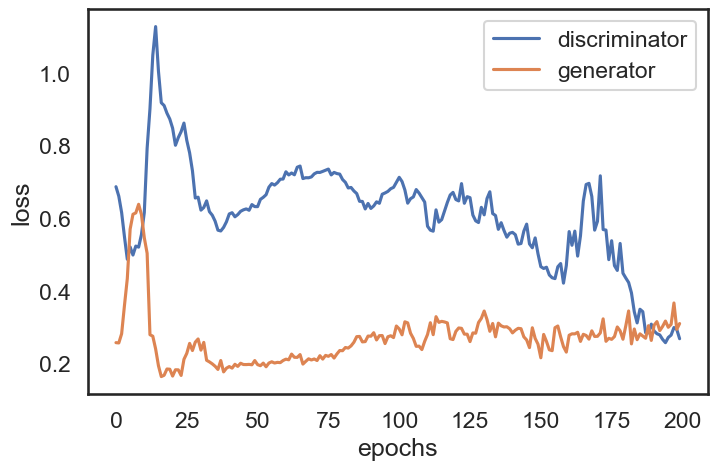

In [271]:
import seaborn as sns
sns.set_context('talk')
sns.set_style('white')

fig, ax = plt.subplots(figsize=(8, 5))
sns.lineplot(data=loss_df, x='epochs', y='D_loss', label='discriminator')
sns.lineplot(data=loss_df, x='epochs', y='G_loss', label='generator')
ax.set_xlabel('epochs')
ax.set_ylabel('loss');

### generated data from trained generator

In [275]:
input_noise = torch.rand(1, 10000, 45)
input_condition = torch.zeros(1, 10000, 1)

In [276]:
generated_samples = netG(input_noise, input_condition)
generated_data_array = generated_samples.detach().numpy().squeeze()
generated_data_unscaled = scaler.inverse_transform(generated_data_array)
generated_data_df = pd.DataFrame(generated_data_unscaled, columns=column_names)
print(f"generated_data: {generated_data_df.shape}")

generated_data: (10000, 45)


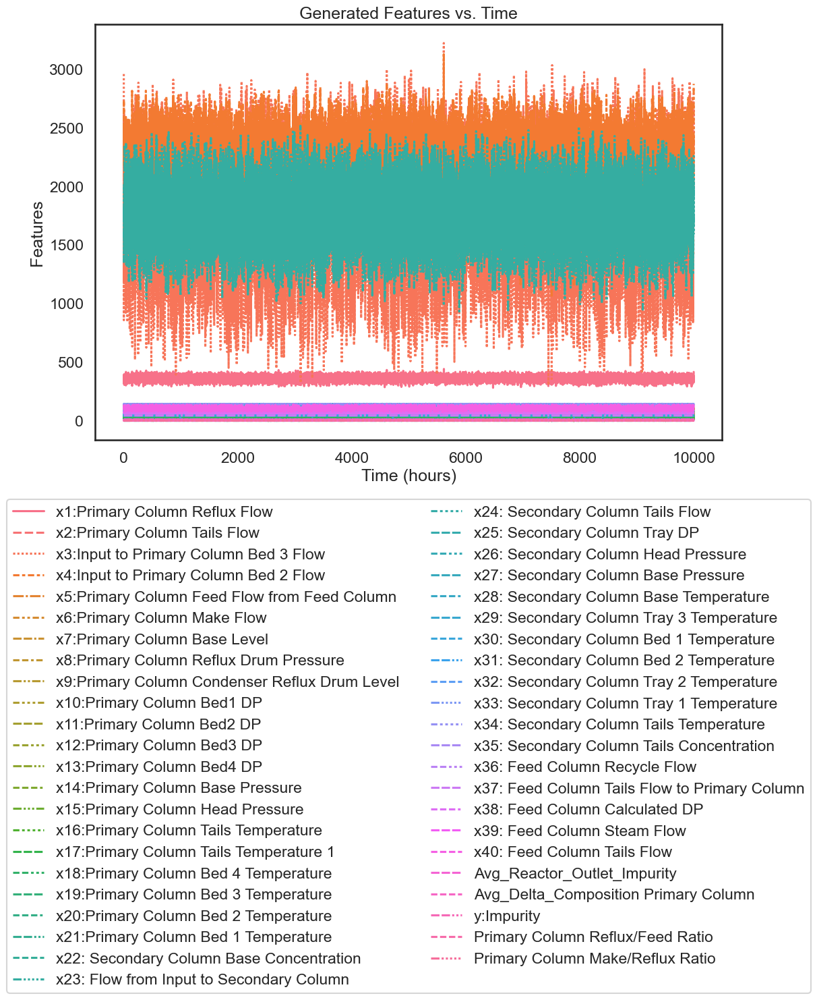

In [282]:
sns.lineplot(data=generated_data_df)
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -1.35), ncols=2)
plt.title('Generated Features vs. Time')
plt.xlabel('Time (hours)')
plt.ylabel('Features');

### plotting the comparison between each original and generated feature

In [280]:
def plot_comparison(original_df: pd.DataFrame, 
                    generated_df: pd.DataFrame, 
                    n_timepoints: int,
                    column_names: list):
    """plots each feature of the original data compared to the generated data for the first 0 to n_timepoints."""
    for name in column_names:
        fig, ax = plt.subplots()
        sns.lineplot(data=original_df[0:n_timepoints], x=np.arange(0, n_timepoints), y=name, label='original data')
        sns.lineplot(data=generated_df[0:n_timepoints], x=np.arange(0, n_timepoints), y=name, label='generated data')
        ax.legend()
        ax.set_title(f"{name} vs. Time")
        ax.set_xlabel('Time')
        ax.set_ylabel(name);

/var/folders/7m/035mpxc12mg3_wj_0q496wxc0000gn/T/ipykernel_1747/129650624.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


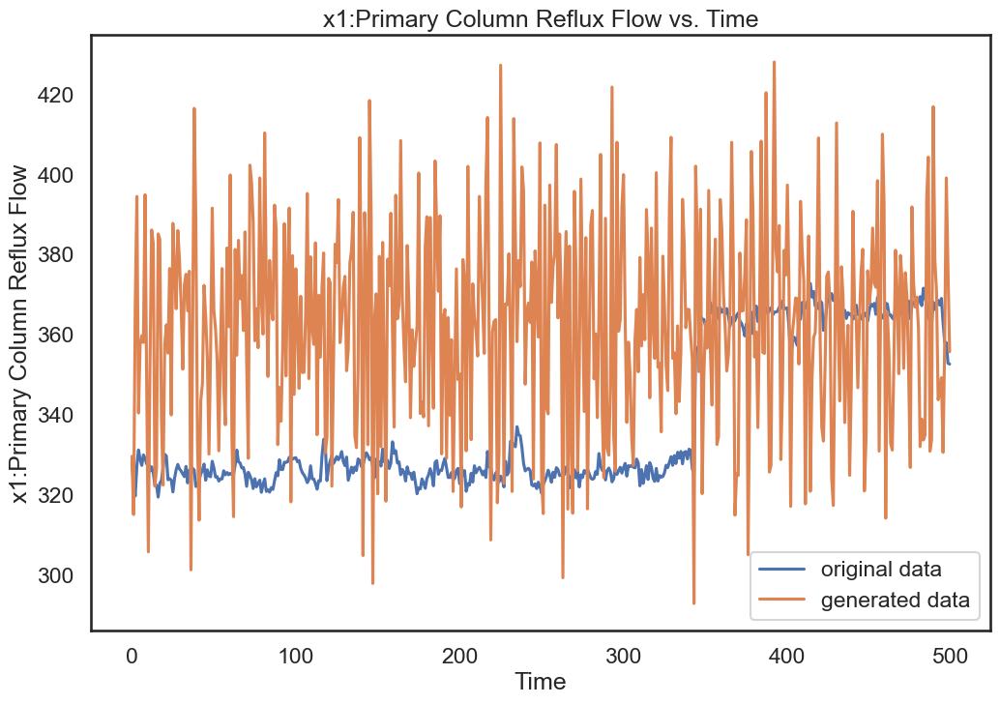

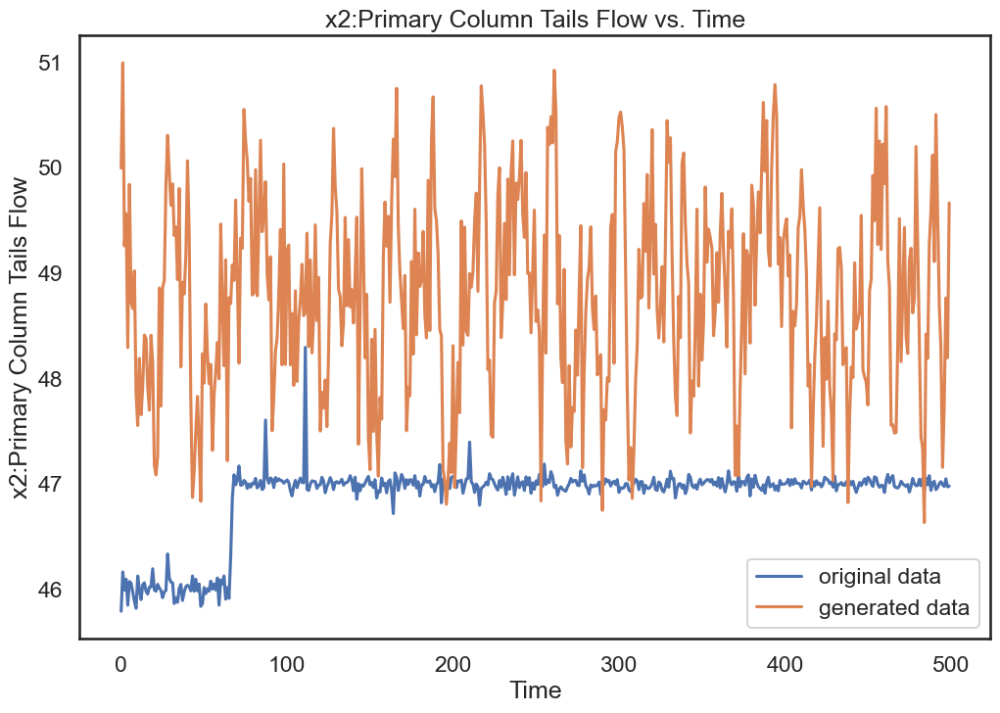

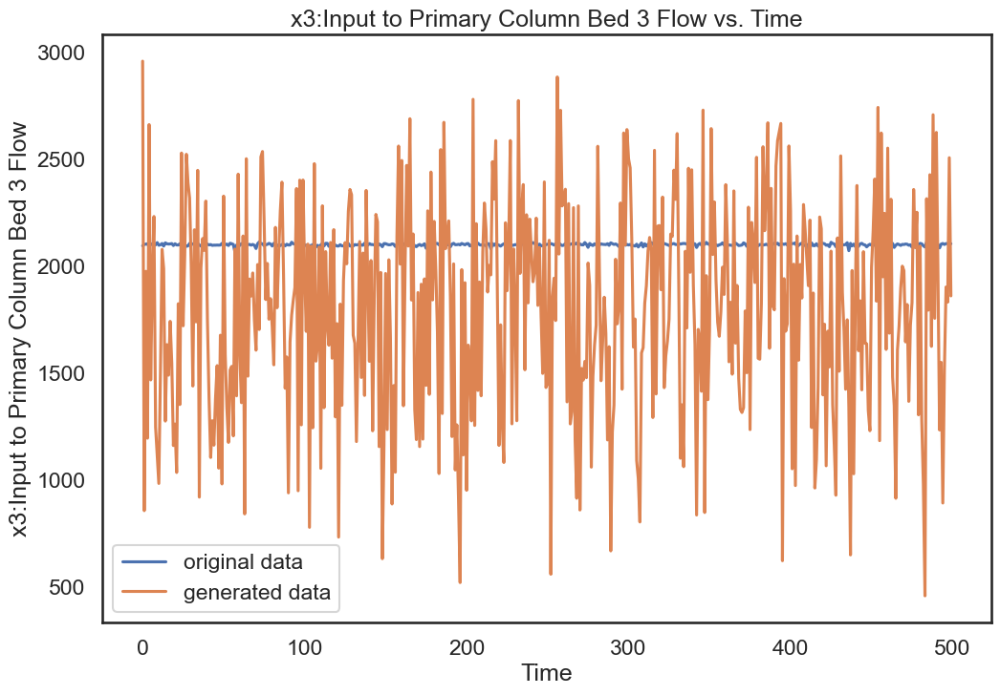

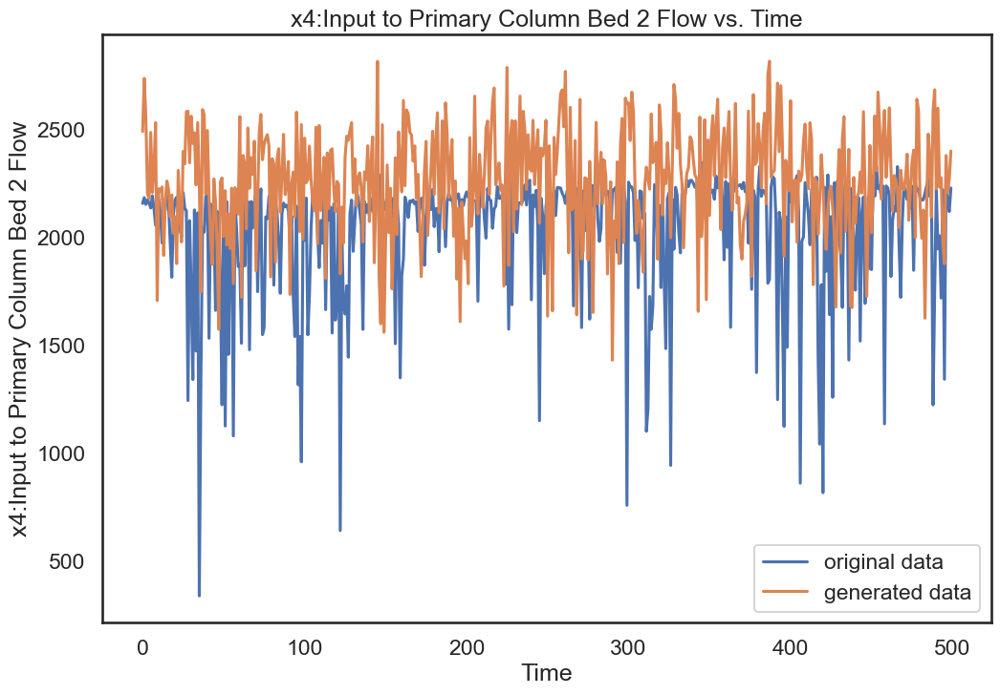

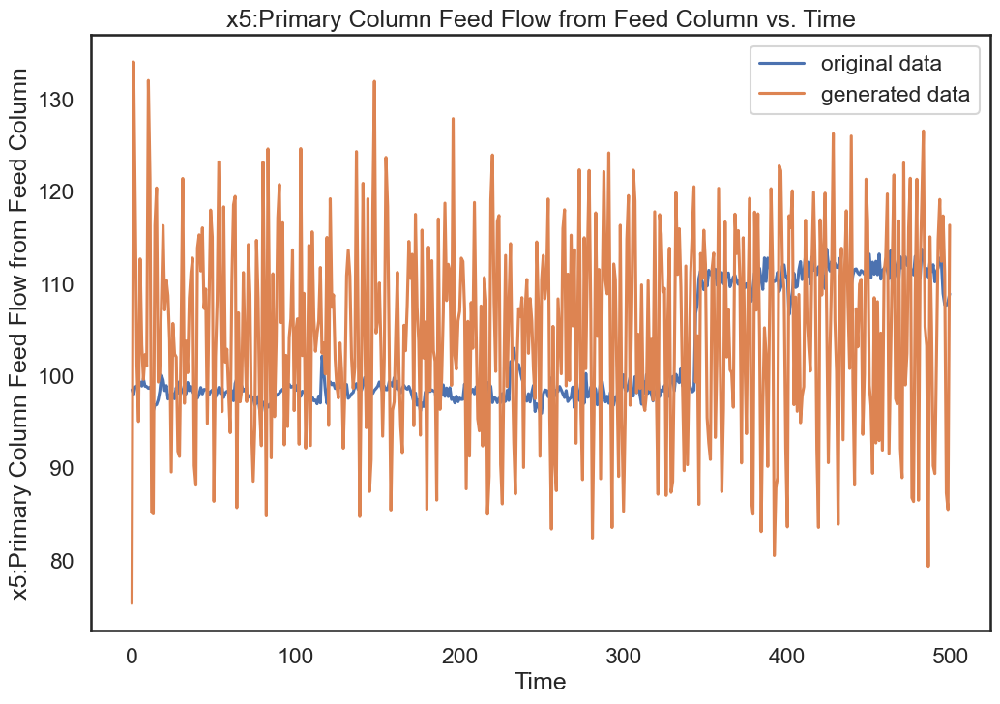

...

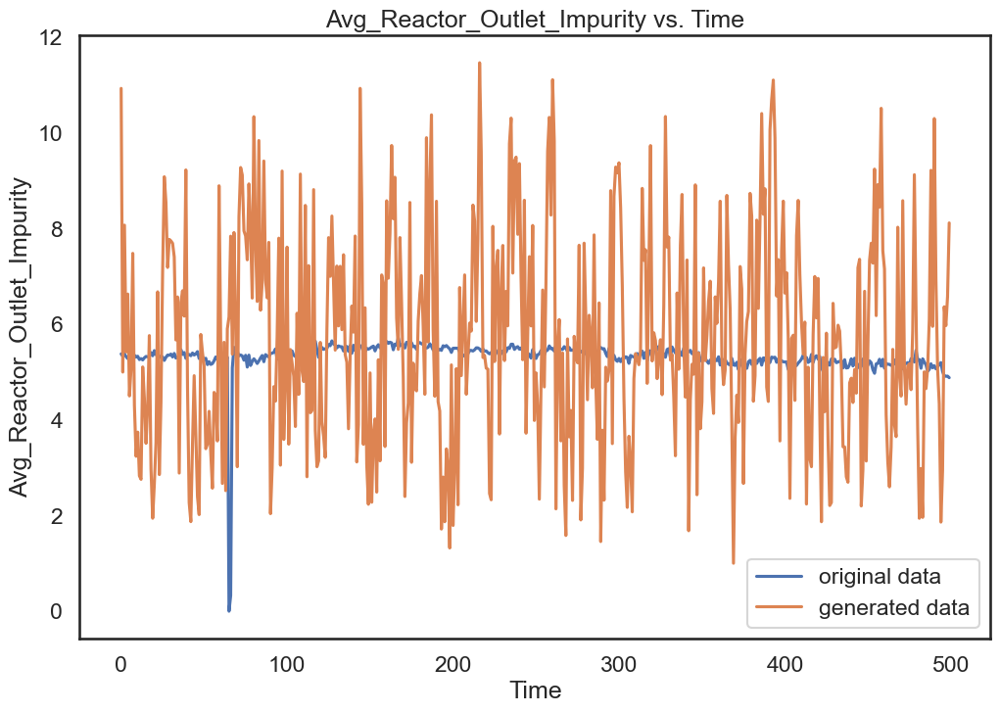

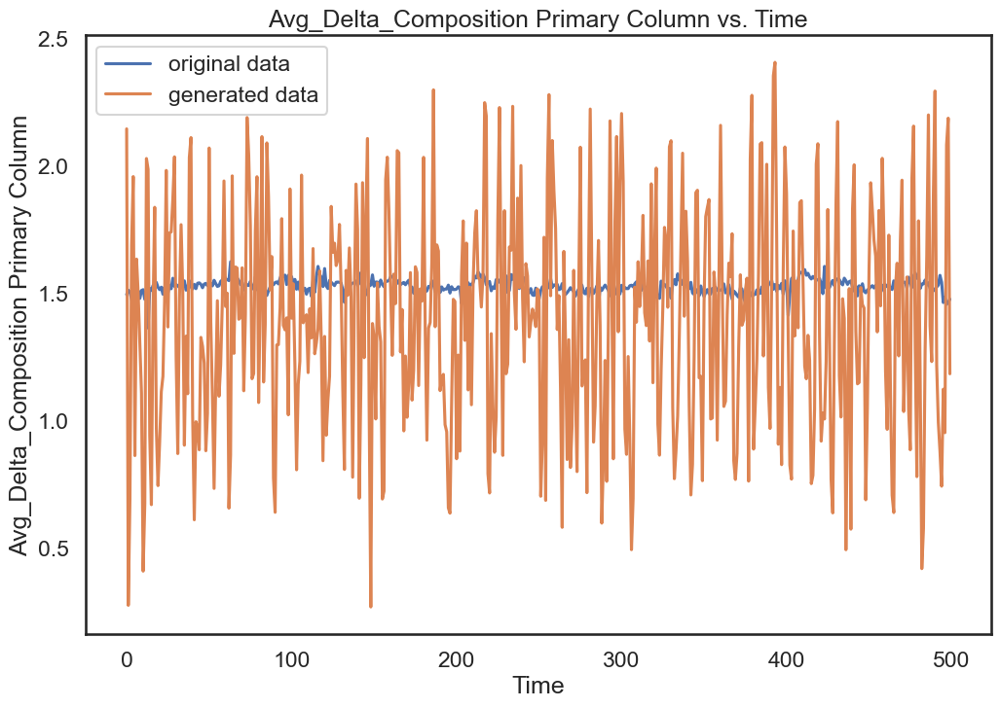

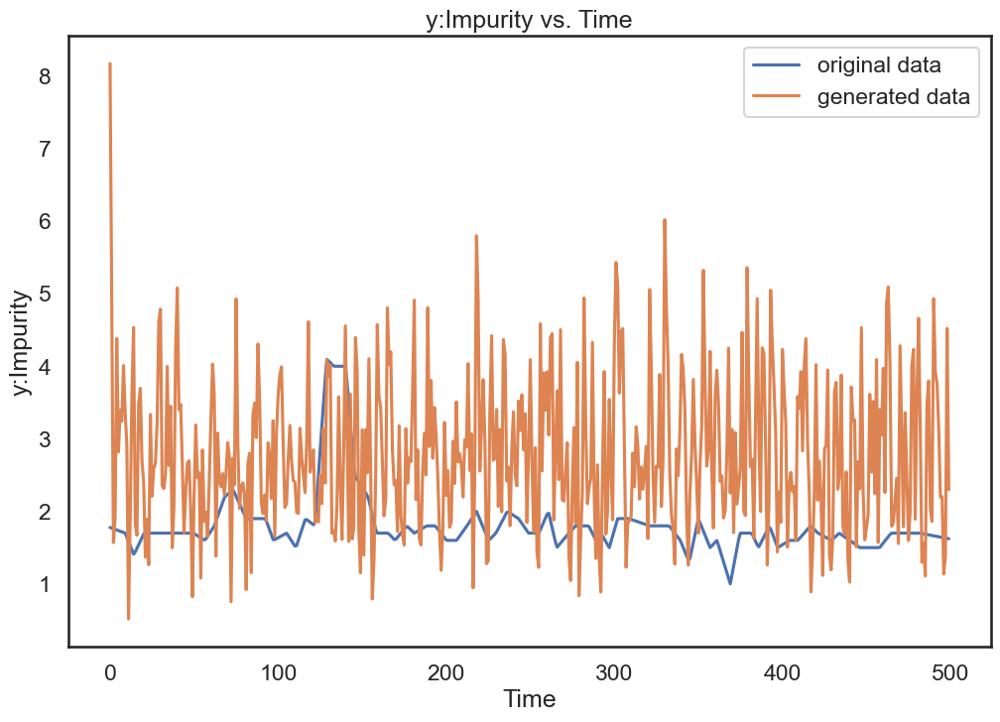

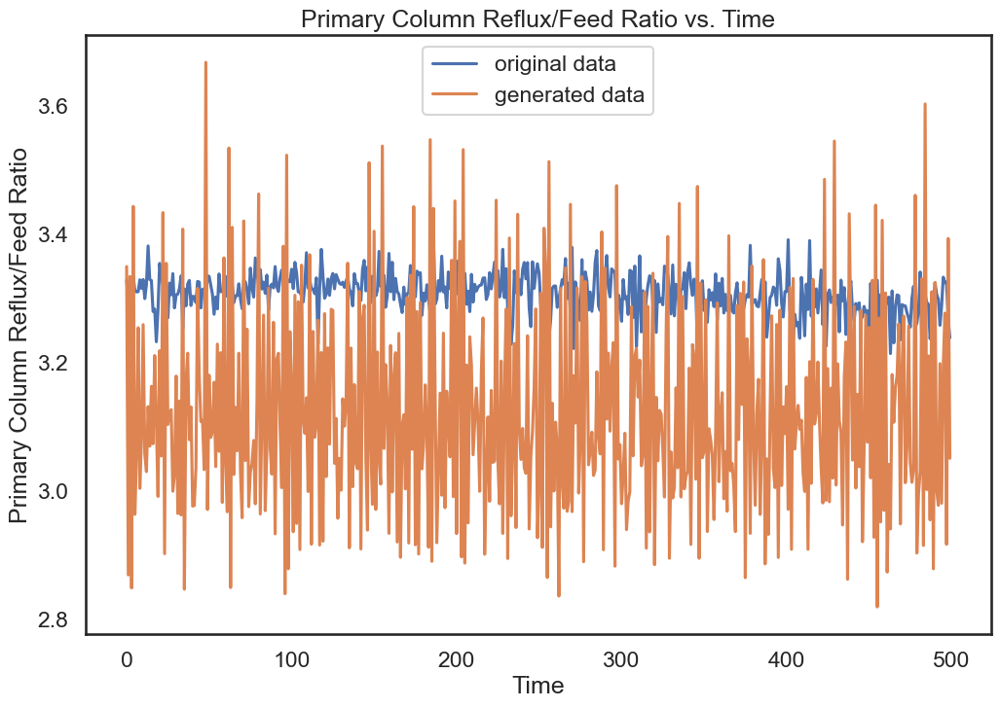

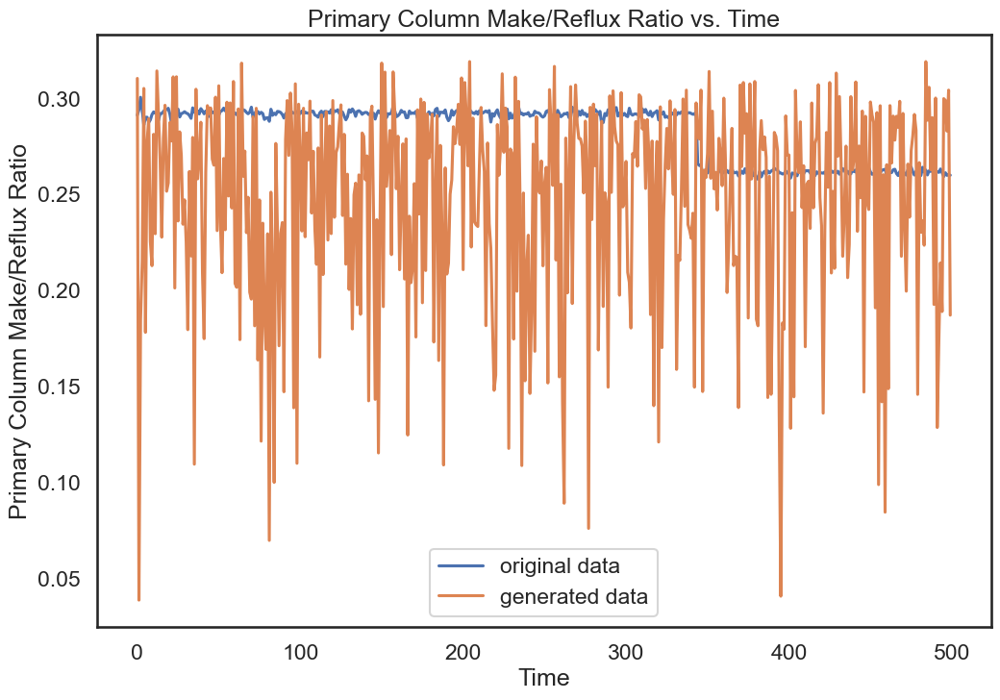

In [281]:
plot_comparison(original_df=data,
                generated_df=generated_data_df,
                n_timepoints=500,
                column_names=column_names)